# Проект: исследование рынка общепита в Москве

**Объект исследования** - рынок заведений общественного питания в городе Москва.

**Цель исследования** - подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Источник данных** - данные сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках.

## Шаг: Загрузим данные и изучим общую информацию

In [1]:
import pandas as pd 
import re
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go 
import numpy as np
from numpy import median
import plotly.express as px
import folium
from folium import Marker, Map
from folium.plugins import MarkerCluster
from folium import Map, Choropleth

Загрузим данные о заведениях общественного питания Москвы.

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


 **Описание данных**

Таблица data содержит 14 столбцов:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»;
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»;
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Таким образом, у нас имеется информация о 8406 заведений Москвы. В некоторых столбцах датасета имеются пропуски. Далее следует выполнить предобработку данных и при необходимости обработать их.

## Шаг: Выполним предобработку данных

In [4]:
# посмотрим в каких столбцах имеются пропуски и насколько их много
pd.DataFrame(round(data.isna().mean()*100)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


Наибольшее количество пропусков в столбцах с оценками средней стоимости чашки кофе, среднего чека, средней стоимости заказа и в целом в категории цен в заведении. Но заполнять такие пропуски средними значениями - плохая идея, так как появится большая вероятность исказить данные. Также большое количество пропусков в столбце с количеством посадочных мест.

In [5]:
data.dtypes

name                  object
category              object
address               object
district              object
hours                 object
lat                  float64
lng                  float64
rating               float64
price                 object
avg_bill              object
middle_avg_bill      float64
middle_coffee_cup    float64
chain                  int64
seats                float64
dtype: object

Типы данных в каждой колонке соответствуют своему содержанию.

In [6]:
data.duplicated().sum() # проверили таблицу на наличие явных дубликатых. Их количество = 0.

0

In [7]:
data[['name','address']].duplicated().sum() #проверим на наличие дубликатов в сочетании столбцов с названием и адресом

0

In [8]:
#приведем названия заведений и адреса к нижнему регистру и снова проверим на дубликаты
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data[['name','address']].duplicated().sum()

4

In [9]:
duplicated_data = data[data[['name','address']].duplicated(keep=False)] # выведем таблицу с дубликатами на просмотр
duplicated_data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Таких дубликатов всего 4, для нашего датасета это слишком малое количество, которое не сможет исказить данные.

In [10]:
# создадим столбец с названиям улиц
def street(row):
    address = row['address']
    return address.split(',')[1]

data['street'] = data.apply(street, axis=1)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


In [11]:
# создадим столбец 'is_24/7' с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


Имеющиеся данные достаточно хорошего качества. Типы данных корректны. Были приведены к нижнему регистру названия объектов и адреса. Созданы столбцы 'street' c наименованием улиц и 'is_24/7' с обозначением, что заведение работает ежедневно и круглосуточно.

Обнаружены пропуски в столбцах с оценками средней стоимости чашки кофе, среднего чека, средней стоимости заказа и в целом в категории цен в заведении. Но заполнять такие пропуски средними значениями не стоит, так как появится большая вероятность исказить данные.

## Шаг: Анализ данных

- Для начала изучим какие категории заведений представлены в данных:

In [12]:
# исследуем количество объектов общественного питания по категориям:
data_cat = data['category'].value_counts()
data_cat

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [13]:
fig = go.Figure(go.Pie(
    labels=data_cat.index, 
    values = data_cat,
    title='Соотношение категорий объектов общественного питания по количеству'))
   # pull = [0.1, 0]))
fig.show()

Наиболее популярная категория заведений - это кафе, она занимает 28,3% от общего количества заведение Москвы. Следующая по популярности категория - рестораны, их доля 24,3%. Наименьшую долю на рынке имеют категории столовая и булочная с долями 3,75% и 3,05% соответственно.

- Исследуем количество посадочных мест в заведениях по категориям:

In [14]:
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

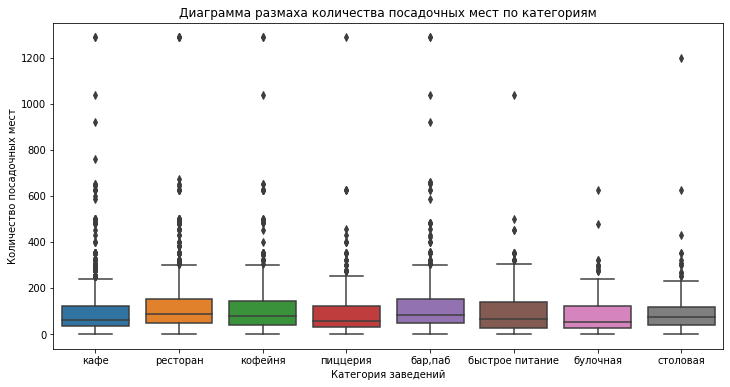

In [15]:
plt.figure(figsize = (12,6))
ax = sns.boxplot(x='category', y='seats', data=data)
ax.set_title('Диаграмма размаха количества посадочных мест по категориям')
ax.set_xlabel('Категория заведений')
ax.set_ylabel('Количество посадочных мест');

Среднее количество посадочных мест в заведениях - 108, но имеет место высокое стандарное отклонение и медианное значение с количеством 75 мест. Это говорит о наличии аномальных значений, максимальное количество посадочных мест - 1288, что скорее всего является ошибочным.

Исходя из этого, следует проводить анализ по медианным значениям, а не по средним, чтобы избежать сдвигов в сторону выбросов.

In [16]:
data_seats = data.groupby('category')['seats'].median().reset_index().sort_values(by ='seats', ascending=False)
data_seats

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


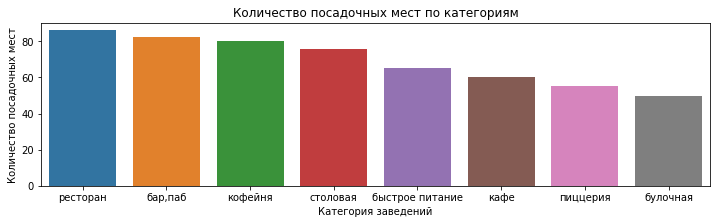

In [17]:
plt.figure(figsize = (12,3))
ax = sns.barplot(x='category', y='seats', data=data_seats)
ax.set_title('Количество посадочных мест по категориям')
ax.set_xlabel('Категория заведений')
ax.set_ylabel('Количество посадочных мест');

Наибольшее количество посадочных мест (86) имеют рестораны, следом идут бары (82) и кофейни (80). Наименьшее количество мест имеется в булочных (50), что и логично, так как в булочных часто берут продукцию с собой или же сидят за столиками гораздо меньше по времени, чем в ресторане или баре.

- Рассмотрим соотношение сетевых и несетевых заведений:

In [18]:
# рассмотрим соотношение сетевых и несетевых заведений в датасете
data['chain'].value_counts()

0    5201
1    3205
Name: chain, dtype: int64

In [19]:
# изобразим соотношение сетевых и несетевых заведений в датасете
fig = go.Figure(go.Pie(
    labels=['Несетевые', 'Сетевые'], 
    values = data['chain'].value_counts(),
    pull = [0.1, 0]))
fig.update_layout(title='Cоотношение сетевых и несетевых заведений', # указываем заголовок графика
                  width=600, # указываем размеры графика
                  height=400,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Тип заведения',
                                    showarrow=False)])
fig.show()

В Москве преобладают несетевые заведения, их доля составляет почти 62% от общего числа заведений города. Соответственно доля сетевых заведений - всего 38,1%.

In [20]:
#Создадим таблицу распределения объектов по виду и принадлежности к сети
chains = data.groupby('category').agg({'chain':['count','sum']}).reset_index()
chains.columns = ['category','count_all', 'count_chain']
chains['ratio, %'] = (100*chains['count_chain'] / chains['count_all']).round()
chains = chains.sort_values(by='ratio, %', ascending = False)
chains

,category,count_all,count_chain,"ratio, %"
1,булочная,256,157,61.0
5,пиццерия,633,330,52.0
4,кофейня,1413,720,51.0
2,быстрое питание,603,232,38.0
6,ресторан,2043,730,36.0
3,кафе,2378,779,33.0
7,столовая,315,88,28.0
0,"бар,паб",765,169,22.0


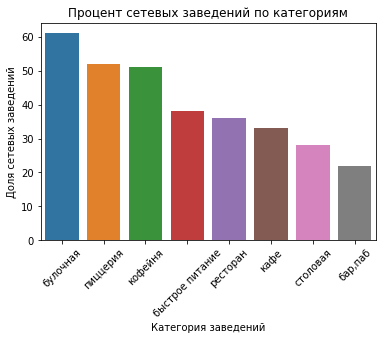

In [21]:
ax = sns.barplot(x='category', y='ratio, %', data=chains)
ax.set_title('Процент сетевых заведений по категориям')
ax.set_xlabel('Категория заведений')
ax.set_ylabel('Доля сетевых заведений')
plt.xticks(rotation=45);

Сетевое распространение больше всего характерно для булочных (порядка 61%), затем для пиццерий и кофеен (52% и 51% соответственно).
Для остальных категорий заведений принадлежность к сети значительно меньше.
Реже всего сетевыми являются бары и пабы.

- Найдем топ-15 популярных сетей в Москве:

In [22]:
data['name'].value_counts().head(15)

кафе                                   189
шоколадница                            120
домино'с пицца                          77
додо пицца                              74
one price coffee                        72
яндекс лавка                            69
cofix                                   65
prime                                   50
хинкальная                              44
шаурма                                  43
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
ресторан                                34
Name: name, dtype: int64

При выделении топ-15 заведений по количеству заведений этой сети в регионе можно заметить, что в топ попадают такие наименования, как 'кафе', 'хинкальная','шаурма', 'ресторан', 'столовая'. Вряд ли такие заведения являются сетью, скорее всего, это просто разрозненные точки питания без наименования. Исключим их из рассматриваемой группировки.

In [23]:
# создадим список исключений
to_delete = ['кафе', 'хинкальная','шаурма', 'ресторан', 'столовая']
# отфильтруем данные, сгруппируем по наименованию и посчитаем количество заведений
top_15 = data.query('name not in @to_delete').groupby('name')[['name']].count()
# переименуем столбец
top_15.columns = ['count']
# отсортируем и оставим пятнадцать лидеров
top_15 = top_15.reset_index().sort_values(by='count', ascending=False).head(15)
top_15

,name,count
5413,шоколадница,120
2532,домино'с пицца,77
2500,додо пицца,74
1137,one price coffee,72
5486,яндекс лавка,69
413,cofix,65
1263,prime,50
3177,кофепорт,42
3235,кулинарная лавка братьев караваевых,39
4697,теремок,38


In [24]:
# строим столбчатую диаграмму 
fig = px.bar(top_15.sort_values(by='count', ascending=True), # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='ТОП-15 популярных сетей в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Наименование заведения')
fig.show() # выводим график

По количеству заведений в регионе лидирует с большим отрывом "Шоколадница", в Москве насчитывается 120 заведений этой сети. Больше 70 точек имеют "домино'с пицца", "додо пицца", "one price coffee", это действительно очень популярные заведения, которые у всех 'на слуху'.

В целом можно отметить, что наибольшее количество заведений имеют кофейни и пиццерии. Также в топ-15 попал сервис заказа продуктов Яндекс.Лавка, он на 5 месте по популярности среди всех сетей Москвы. С одной стороны это говорит о востребованности данных направлений, с другой - может свидетельствовать о перенасыщении рынка заведениями таких категорий.

- Рассмотрим, какие административные районы Москвы присутствуют в датасете:

In [25]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


In [26]:
data['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

Всего в датасете присутствуют 9 административных районов Москвы.

In [27]:
data_dist = data.pivot_table(index='district', columns='category', values='name', aggfunc='count')
data_dist

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,239,150,71,218,24
Северный административный округ,68,39,58,235,193,77,189,41
Северо-Восточный административный округ,63,28,82,269,159,68,182,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,670,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,202,44


In [28]:
fig = px.bar(data_dist)
fig.update_layout(title=('График количества заведений в зависимости от района'), xaxis_title=('Район'), yaxis_title=('Количество заведений'))
fig.show()

Наибольшее количество заведений, как и ожидалось, размещено в ЦАО города, а значит и конкуренция здесь наиболее высокая, особенно в категории ресторанов и кофеен. В  Северо-Западном административном округе наименьшее количество заведений.

- Визуализируем распределение средних рейтингов по категориям заведений:

In [29]:
data['rating'].describe()

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Средний рейтинг по всем категориям заведений (4,2) чуть ниже медианного рейтинга (4,3), аномальных значений нет. Но все же лучше использовать медиану, чтобы расчеты были корректнее.

In [30]:
data_rating = data.groupby('category')['rating'].median().reset_index().sort_values(by ='rating', ascending=False)
data_rating

,category,rating
0,"бар,паб",4.4
1,булочная,4.3
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.3
2,быстрое питание,4.2
3,кафе,4.2


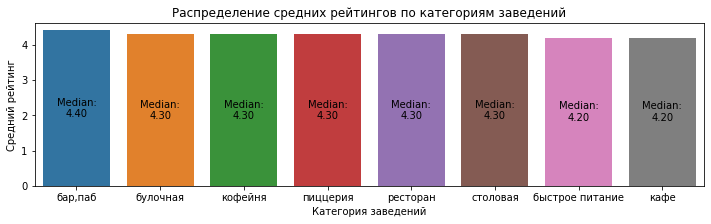

In [31]:
plt.figure(figsize = (12,3))

ax = sns.barplot(x='category', y='rating', data=data_rating)


for p in ax.patches:
    h, w, x = p.get_height(), p.get_width(), p.get_x()
    xy = (x + w / 2., h / 2)
    text = f'Median:\n{h:0.2f}'
    ax.annotate(text=text, xy=xy, ha='center', va='center')

ax.set_title('Распределение средних рейтингов по категориям заведений')
ax.set_xlabel('Категория заведений')
ax.set_ylabel('Средний рейтинг');


Усреднённые рейтинги в разных типах общепита отличаются не сильно. Всего 0,2 пункта отделяют категорию с максимальным усредненным рейтингом (бары и пабы с оценкой 4,4) от категории с минимальным (кафе с оценкой 4,2).

- Построим картограмму со средним рейтингом заведений каждого района:

In [32]:
rating_dist = data.groupby('district', as_index=False)['rating'].agg('median')
rating_dist

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [33]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_dist,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Заведения, расположенные в ЦАО города, имеют наивысший средний рейтинг - 4,4.

- Отобразим все заведения датасета на карте с помощью кластеров:

In [34]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

- Далее найдем топ-15 улиц по количеству заведений.

In [35]:
# сгруппируем  и посчитаем количество заведений
top_15_street = (data.groupby('street')['name'].count()).reset_index()
# переименуем столбцы
top_15_street.columns = ['street', 'count']
# отсортируем и оставим пятнадцать лидеров
top_15_street = top_15_street.sort_values(by='count', ascending=False).head(15)
top_15_s = list(top_15_street['street']) #создадим переменную со списком наименований улиц
top_15_street

,street,count
837,проспект мира,184
841,профсоюзная улица,122
834,проспект вернадского,108
533,ленинский проспект,107
531,ленинградский проспект,95
379,дмитровское шоссе,88
461,каширское шоссе,77
304,варшавское шоссе,76
532,ленинградское шоссе,70
610,мкад,65


In [36]:
data_15 = data.query('street in @top_15_s') #отберем из датасета заведения, находящиеся на топовых улицах
data_15

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8,donna maria,ресторан,"москва, дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,дмитровское шоссе,False
12,заправка,кафе,"москва, мкад, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,мкад,False
17,чайхана беш-бармак,ресторан,"москва, ленинградское шоссе, 71б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,ленинградское шоссе,True
26,пикочино,пиццерия,"москва, дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,дмитровское шоссе,False
28,mafe,кафе,"москва, мкад, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,мкад,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,люблинская улица,False
8396,пекинский двор,ресторан,"москва, ленинский проспект, 158",Западный административный округ,"ежедневно, 11:00–23:00",55.651706,37.482667,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,200.0,ленинский проспект,False
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица,False
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True


In [37]:
# строим столбчатую диаграмму 
fig = px.bar(data_15
             .pivot_table(index=['street', 'category'], 
                          values='name', aggfunc='count')
             .reset_index()
             .merge(top_15_street, on='street') #присоединяем столбец с кол-вом заведений для сортировки по нему
             .sort_values(by='count', ascending=True),
             x='name', # указываем столбец с данными для оси X
             y='street', # указываем столбец с данными для оси Y
             color='category'
            )
# оформляем график
fig.update_layout(title='ТОП-15 улиц по количеству заведений в разрезе категорий',
                   xaxis_title='Количество заведений',
                   yaxis_title='Наименование улицы')
fig.show() # выводим график

Основная масса заведений всех категорий находится на проспекте Мира. На этой улице максимальное количество кафе, кофеен и ресторанов.
Следующими по числу заведений можно выделить улицы: Профсоюзная, проспект Вернадского и Ленинский проспект.

- Теперь найдем улицы, на которых находится только один объект общепита:

In [38]:
# сгруппируем  и посчитаем количество заведений
street_1 = (data.groupby('street')['name'].count()).reset_index()
# переименуем столбцы
street_1.columns = ['street', 'count']
# оставим только улицы с 1 заведением
street_1 = street_1.query('count == 1')
street_1

,street,count
0,1-й автозаводский проезд,1
1,1-й балтийский переулок,1
2,1-й варшавский проезд,1
3,1-й вешняковский проезд,1
5,1-й голутвинский переулок,1
...,...,...
1425,электрический переулок,1
1432,юго-западный административный округ,1
1437,якиманский переулок,1
1438,яковоапостольский переулок,1


В Москве имеется 457 улиц, на которых находится только один объект общепита. Возможно, следует проанализировать проходимость на этих улицах и выявить места, где не хватает точек общепита. Конкуренция здесь будет не высокой.

- Проанализируем значения средних чеков заведений для каждого района.

In [39]:
# посчитаем медиану среднего чека для каждого района
dist_bill = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median').sort_values('middle_avg_bill', ascending=False)
dist_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [40]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dist_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Наибольшее значение среднего чека (1000 рублей) в среднем по заведениям наблюдается в Центральном и Западном районах города. Тогда как более отдаленные от центра районы (Северо-Восточный, Южный и Юго-Восточный) показывают значения среднего чека в 2 раза меньше, это 500 рублей и менее.

**Таким образом**, в ходе анализа были обнаружены следующие тенденции:
- Наиболее популярная категория заведений - это кафе и рестораны. Наименее распространены на рынке категории столовая и булочная.
- В Москве преобладают несетевые заведения, их доля составляет почти 62% от общего числа заведений города. 
- Сетевое распространение больше всего характерно для булочных (порядка 61%), затем для пиццерий и кофеен (52% и 51% соответственно). Реже всего сетевыми являются бары и пабы.
- По количеству заведений в регионе лидирует с большим отрывом "Шоколадница", в Москве насчитывается 120 заведений этой сети. Больше 70 точек имеют "домино'с пицца", "додо пицца", "one price coffee".
- Наибольшее количество заведений имеют кофейни и пиццерии. С одной стороны это говорит о востребованности данных направлений, с другой - может свидетельствовать о перенасыщении рынка заведениями таких категорий.
- По размещению наибольшее количество заведений находится в ЦАО города, а значит и конкуренция здесь наиболее высокая, особенно в категории ресторанов и кофеен. В Северо-Западном административном округе наименьшее количество заведений.
- Усреднённые рейтинги в разных типах общепита отличаются не сильно. Заведения, расположенные в ЦАО города, имеют наивысший средний рейтинг - 4,4.
- Основная масса заведений всех категорий находится на проспекте Мира. На этой улице максимальное количество кафе, кофеен и ресторанов. Следующими по числу заведений можно выделить улицы: Профсоюзная, проспект Вернадского и Ленинский проспект.
- В Москве имеется 457 улиц, на которых находится только один объект общепита. Возможно, следует проанализировать проходимость на этих улицах и выявить места, где не хватает точек общепита. Конкуренция здесь будет не высокой.
- Наибольшее значение среднего чека (1000 рублей) в среднем по заведениям наблюдается в Центральном и Западном районах города. Тогда как более отдаленные от центра районы (Северо-Восточный, Южный и Юго-Восточный) показывают значения среднего чека в 2 раза меньше, это 500 рублей и менее.

    Все эти факторы необходимо учитывать при выборе места, категории и ценовой политики заведения.
   

## Шаг: Детализируем исследование: открытие кофейни

Попробуем определить, осуществима ли мечта об открытии кофейни в Москве и какие факторы следует учесть при планировании.

In [41]:
data_coffee = data.query('category == "кофейня"')
data_coffee

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,люблинская улица,False
8365,квадрат кофе,кофейня,"москва, волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,0,206.0,волгоградский проспект,False
8376,шоколад имбирь корица,кофейня,"москва, грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,грайвороновская улица,False
8385,cafio,кофейня,"москва, новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,0,NaN,новохохловская улица,False


Всего в Москве на данный момент насчитывается 1413 кофеен.

In [42]:
# изобразим соотношение сетевых и несетевых кофеен в датасете
fig = go.Figure(go.Pie(
    labels=['Несетевые', 'Сетевые'], 
    values = data_coffee['chain'].value_counts(),
    pull = [0.1, 0]))
fig.update_layout(title='Cоотношение сетевых и несетевых кофеен', # указываем заголовок графика
                  width=600, # указываем размеры графика
                  height=400,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Тип заведения',
                                    showarrow=False)])
fig.show()

Для кофеен характерно сетевое распространение, 51% существующих на рынке кофеен - сетевые. Возможно, открытие одной точки такого формата окажется невыгодным и следует рассмотреть открытие сразу несколько кофеен в разных районах города для распределения издержек.

In [43]:
# сгруппируем все кофейни по районам
coffee_dist = (data_coffee.groupby('district', as_index=False)['name'].count()).sort_values('name', ascending=False)
# строим столбчатую диаграмму 
fig = px.bar(coffee_dist.sort_values(by='name', ascending=True), 
             x='name', # указываем столбец с данными для оси X
             y='district', # указываем столбец с данными для оси Y
             text='name' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Количество кофеен в разных районах города',
                   xaxis_title='Количество кофеен',
                   yaxis_title='Район')
fig.show() # выводим график

In [44]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_dist,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Основная масса кофеен сосредоточена ЦАО города. Конечно, это максимально конкурентная среда, но и востребованность кофеен в этом районе также больше, чем в других.

In [45]:
coffee_24_7 = data_coffee[data_coffee['is_24/7'] ==True]
coffee_24_7['name'].count()

59

 Только 59 кофеен рабоют круглосуточно.

In [46]:
# сгруппируем все кофейни по районам
coffee_dist_24_7 = (coffee_24_7.groupby('district', as_index=False)['name'].count()).sort_values('name', ascending=False)

In [47]:
dist_merge = coffee_dist.merge(coffee_dist_24_7, on='district') 
dist_merge.columns = ['district','count_all', 'count_24_7']
dist_merge['ratio, %'] = (100*dist_merge['count_24_7'] / dist_merge['count_all']).round()
dist_merge = dist_merge.sort_values(by='ratio, %', ascending = False)
dist_merge

,district,count_all,count_24_7,"ratio, %"
6,Юго-Западный административный округ,96,7,7.0
0,Центральный административный округ,428,26,6.0
3,Западный административный округ,150,9,6.0
5,Восточный административный округ,105,5,5.0
1,Северный административный округ,193,5,3.0
8,Северо-Западный административный округ,62,2,3.0
2,Северо-Восточный административный округ,159,3,2.0
4,Южный административный округ,131,1,1.0
7,Юго-Восточный административный округ,89,1,1.0


То есть всего 7% и менее кофеен работают круглосуточно в каждом округе. Возможно, именно круглосуточных кофеен и не хватает жителям.

In [48]:
rating_dist_coffee = data_coffee.groupby('district', as_index=False)['rating'].agg('median')
rating_dist_coffee

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.2
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [49]:
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_dist_coffee,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

Средние рейтинги стабильны по всем округам. Средняя оценка кофеен 4,3 практически во всех округах. Это значит, есть возможность выделиться улучшенным сервисом среди остальных. Можно проанализировать негативные отзывы на кофейни, выявить их слабые места и привлекать посетителей именно таким преимуществом, которого им не хватает.

In [50]:
data_coffee['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Столбец со стоимостью чашки капучино имеет выбросы, максимальное значение - 1568 руб. за чашку при медиане в 170 руб. Отбросим аномальные значения, т.к. мы планируем открытие доступной кофейни и нам на данном этапе не интересен более дорогостоящий сегмент.

In [51]:
# сделаем срез по 3-му квартилю
data_coffee = data_coffee.query('middle_coffee_cup <= 225')

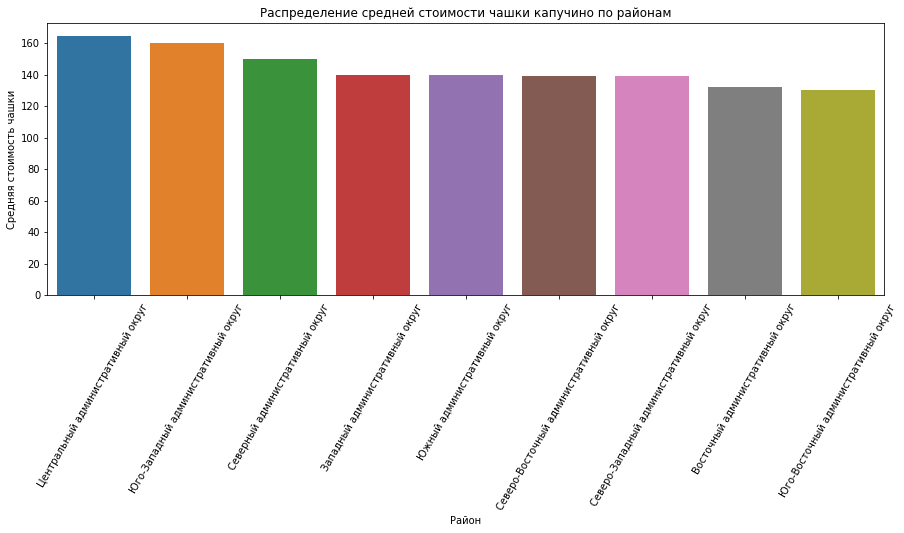

In [52]:
# расcмотрим среднюю стоимость чашки капучино по районам
cup_dist = (data_coffee
            .groupby('district', as_index=False)['middle_coffee_cup']
            .agg('median')
            .sort_values('middle_coffee_cup', ascending=False))
plt.figure(figsize = (15,5))
ax = sns.barplot(x='district', y='middle_coffee_cup', data=cup_dist)
ax.set_title('Распределение средней стоимости чашки капучино по районам')
ax.set_xlabel('Район')
ax.set_ylabel('Средняя стоимость чашки')
plt.xticks(rotation=60);

По районам средняя стоимость чашки капучино различается незначительно от 130 до 165 рублей. На этот диапазон и следует ориентироваться. Чем ближе к центру - тем дороже.


**Таким образом**, выбранный основателями фонда тип заведения - кофейня, достаточно популярный, кофейни занимают 16,8% от общего количества заведений Москвы. С одной стороны это говорит о востребованности данной категории, с другой - может свидетельствовать о перенасыщении рынка кофейнями. Но так как заказчики не боятся конкуренции в этой сфере, можно дать следующие рекомендации:

- для кофеен характерно сетевое распространение, 51% существующих на рынке кофеен - сетевые. Возможно, открытие одной точки такого формата окажется невыгодным и следует рассмотреть открытие сразу несколько кофеен в разных районах города для распределения издержек.
- наибольшее количество заведений находится в ЦАО города, а значит и конкуренция здесь наиболее высокая, но и востребованность кофеен в этом районе также больше, чем в других. Основная масса заведений всех категорий находится на проспекте Мира. На этой улице максимальное количество кафе, кофеен и ресторанов. Следующими по числу заведений можно выделить улицы: Профсоюзная, проспект Вернадского и Ленинский проспект. 
- если же хочется начать бизнес в менее конкурентной среде, следует рассмотреть варианты в Северо-Западном административном округе, где наименьшее количество заведений.
- всего 7% и менее кофеен работают круглосуточно в каждом округе. Возможно, именно круглосуточных кофеен не хватает жителям.
- средний рейтинг кофеен 4,3 практически во всех округах. Это значит, есть возможность выделиться более высоким сервисом среди аналогичных заведений. Можно проанализировать негативные отзывы на кофейни, выявить их слабые места и привлекать посетителей именно таким преимуществом, которого им не хватает.
- средняя стоимость чашки капучино в разных районах города от 130 до 165 рублей. На этот диапазон и следует ориентироваться. Чем ближе к центру - тем дороже.

Презентация: <https://disk.yandex.ru/i/WEO5uYm3Ee2u5A>